In [2]:
import graphlab
graphlab.set_runtime_config('GRAPHLAB_DEFAULT_NUM_PYLAMBDA_WORKERS', 4)

This non-commercial license of GraphLab Create for academic use is assigned to eduard.bonada@gmail.com and will expire on September 06, 2017.


[INFO] graphlab.cython.cy_server: GraphLab Create v2.1 started. Logging: C:\Users\ebonada\AppData\Local\Temp\graphlab_server_1474994253.log.0


### Load music data and explore it

In [8]:
song_data = graphlab.SFrame('song_data/')
song_data

user_id,song_id,listen_count,title,artist
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SOAKIMP12A8C130995,1,The Cove,Jack Johnson
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SOBBMDR12A8C13253B,2,Entre Dos Aguas,Paco De Lucia
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SOBXHDL12A81C204C0,1,Stronger,Kanye West
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SOBYHAJ12A6701BF1D,1,Constellations,Jack Johnson
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SODACBL12A8C13C273,1,Learn To Fly,Foo Fighters
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SODDNQT12A6D4F5F7E,5,Apuesta Por El Rock 'N'Roll ...,Héroes del Silencio
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SODXRTY12AB0180F3B,1,Paper Gangsta,Lady GaGa
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SOFGUAY12AB017B0A8,1,Stacked Actors,Foo Fighters
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SOFRQTD12A81C233C0,1,Sehr kosmisch,Harmonia
b80344d063b5ccb3212f76538f3d9e43d87dca9e ...,SOHQWYZ12A6D4FA701,1,Heaven's gonna burn youreyes ...,Thievery Corporationfeat. Emiliana Torrini ...


In [10]:
song_data['listen_count']

dtype: int
Rows: 1116609
[1L, 2L, 1L, 1L, 1L, 5L, 1L, 1L, 1L, 1L, 1L, 5L, 1L, 1L, 5L, 1L, 6L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 2L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 8L, 1L, 2L, 1L, 1L, 1L, 1L, 2L, 1L, 1L, 1L, 5L, 5L, 2L, 1L, 9L, 2L, 2L, 1L, 1L, 6L, 2L, 1L, 10L, 1L, 1L, 9L, 1L, 1L, 1L, 10L, 2L, 6L, 13L, 6L, 4L, 2L, 4L, 1L, 3L, 5L, 1L, 8L, 18L, 12L, 2L, 2L, 1L, 2L, 2L, 2L, 1L, 3L, 4L, 3L, 1L, 2L, ... ]

(array([  1.11581100e+06,   6.66000000e+02,   8.10000000e+01,
          2.50000000e+01,   1.50000000e+01,   3.00000000e+00,
          3.00000000e+00,   3.00000000e+00,   1.00000000e+00,
          1.00000000e+00]),
 array([   1. ,   92.9,  184.8,  276.7,  368.6,  460.5,  552.4,  644.3,
         736.2,  828.1,  920. ]),
 <a list of 10 Patch objects>)

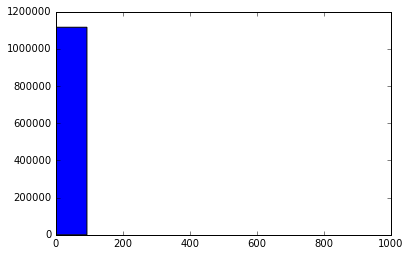

In [14]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.hist(song_data['listen_count'])

Not much visual aid from the histogram... most songs listened a few times

In [15]:
# Showing most listened songs
graphlab.canvas.set_target('ipynb')
song_data['song'].show()

In [16]:
# Count number of unique users in the dataset
users = song_data['user_id'].unique()
len(users)

66346

### Create a Popularity RecSys (no personalization)

In [20]:
# training & tests sets 
train_data,test_data = song_data.random_split(.8,seed=0)

In [23]:
# popularity recommender (no personalization)
popularity_model = graphlab.popularity_recommender.create(train_data,
                                                         user_id='user_id',
                                                         item_id='song')

Recsys training: model = popularity

Warning: Ignoring columns song_id, listen_count, title, artist;

To use one of these as a target column, set target = <column_name>

and use a method that allows the use of a target.

Preparing data set.

Data has 893580 observations with 66085 users and 9952 items.

Data prepared in: 2.32878s

893580 observations to process; with 9952 unique items.

In [24]:
# recommend songs for user[0]
popularity_model.recommend(users=[users[0]])

user_id,song,score,rank
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Sehr kosmisch - Harmonia,4754.0,1
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Undo - Björk,4227.0,2
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,You're The One - DwightYoakam ...,3781.0,3
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Dog Days Are Over (RadioEdit) - Florence + The ...,3633.0,4
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Revelry - Kings Of Leon,3527.0,5
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Horn Concerto No. 4 in Eflat K495: II. Romance ...,3161.0,6
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Secrets - OneRepublic,3148.0,7
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Fireflies - CharttraxxKaraoke ...,2532.0,8
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Tive Sim - Cartola,2521.0,9
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Drop The World - LilWayne / Eminem ...,2053.0,10


In [25]:
# recommend songs for user[1]
popularity_model.recommend(users=[users[1]])

user_id,song,score,rank
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Sehr kosmisch - Harmonia,4754.0,1
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Undo - Björk,4227.0,2
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,You're The One - DwightYoakam ...,3781.0,3
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Dog Days Are Over (RadioEdit) - Florence + The ...,3633.0,4
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Revelry - Kings Of Leon,3527.0,5
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Horn Concerto No. 4 in Eflat K495: II. Romance ...,3161.0,6
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Secrets - OneRepublic,3148.0,7
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Hey_ Soul Sister - Train,2538.0,8
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Fireflies - CharttraxxKaraoke ...,2532.0,9
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Tive Sim - Cartola,2521.0,10


Fuck! Same recommendation for this user also... Well, it was a popularity recommender (not personalized)

### Create an item-similarity RecSys (with personalization)

In [26]:
personalized_model = graphlab.item_similarity_recommender.create(train_data,
                                                                user_id='user_id',
                                                                item_id='song')

Recsys training: model = item_similarity

Warning: Ignoring columns song_id, listen_count, title, artist;

To use one of these as a target column, set target = <column_name>

and use a method that allows the use of a target.

Preparing data set.

Data has 893580 observations with 66085 users and 9952 items.

Data prepared in: 2.21221s

Training model from provided data.

Gathering per-item and per-user statistics.

+--------------------------------+------------+

| Elapsed Time (Item Statistics) | % Complete |

+--------------------------------+------------+

| 40.024ms                       | 1.5        |

| 97.577ms                       | 100        |

+--------------------------------+------------+

Setting up lookup tables.

Processing data in one pass using dense lookup tables.

+-------------------------------------+------------------+-----------------+

| Elapsed Time (Constructing Lookups) | Total % Complete | Items Processed |

+-------------------------------------+------------------+-----------------+

| 593.484ms                           | 0                | 0               |

| 3.17s                               | 100              | 9952            |

+-------------------------------------+------------------+-----------------+

Finalizing lookup tables.

Generating candidate set for working with new users.

Finished training in 4.3776s

In [27]:
# recommend songs for user[0]
personalized_model.recommend(users=[users[0]])

user_id,song,score,rank
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Cuando Pase El Temblor -Soda Stereo ...,0.0194504536115,1
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Fireflies - CharttraxxKaraoke ...,0.0144737317012,2
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Love Is A Losing Game -Amy Winehouse ...,0.0142865960415,3
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Marry Me - Train,0.014133471709,4
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Secrets - OneRepublic,0.013591665488,5
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Sehr kosmisch - Harmonia,0.0133987894425,6
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Te Hacen Falta Vitaminas- Soda Stereo ...,0.0129302831796,7
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,OMG - Usher featuringwill.i.am ...,0.0127778282532,8
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Y solo se me ocurreamarte (Unplugged) - ...,0.0123411279458,9
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,No Dejes Que... -Caifanes ...,0.0121042499175,10


In [28]:
# recommend songs for user[1]
personalized_model.recommend(users=[users[1]])

user_id,song,score,rank
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Riot In Cell Block NumberNine - Dr Feelgood ...,0.0374999940395,1
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Sei Lá Mangueira -Elizeth Cardoso ...,0.0331632643938,2
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,The Stallion - Ween,0.0322580635548,3
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Rain - Subhumans,0.0314159244299,4
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,West One (Shine On Me) -The Ruts ...,0.0306771993637,5
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Back Against The Wall -Cage The Elephant ...,0.0301204770803,6
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Life Less Frightening -Rise Against ...,0.0284431129694,7
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,A Beggar On A Beach OfGold - Mike And The ...,0.0230024904013,8
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Audience Of One - RiseAgainst ...,0.0193938463926,9
279292bb36dbfc7f505e36ebf038c81eb1d1d63e ...,Blame It On The Boogie -The Jacksons ...,0.0189873427153,10


Well, at least the recommendations are different...

In [30]:
# Get similar songs to a song
personalized_model.get_similar_items(['With Or Without You - U2'])

song,similar,score,rank
With Or Without You - U2,I Still Haven't FoundWhat I'm Looking For ...,0.042857170105,1
With Or Without You - U2,Hold Me_ Thrill Me_ KissMe_ Kill Me - U2 ...,0.0337349176407,2
With Or Without You - U2,Window In The Skies - U2,0.0328358411789,3
With Or Without You - U2,Vertigo - U2,0.0300751924515,4
With Or Without You - U2,Sunday Bloody Sunday - U2,0.0271317958832,5
With Or Without You - U2,Bad - U2,0.0251798629761,6
With Or Without You - U2,A Day Without Me - U2,0.0237154364586,7
With Or Without You - U2,Another Time AnotherPlace - U2 ...,0.0203251838684,8
With Or Without You - U2,Walk On - U2,0.0202020406723,9
With Or Without You - U2,Get On Your Boots - U2,0.0196850299835,10


# Quantitative comparison between the models: Precision-Recall curve


In [34]:
if graphlab.version[:3] >= "1.6":
    model_performance = graphlab.compare(test_data, [popularity_model, personalized_model], user_sample=0.05)
    graphlab.show_comparison(model_performance,[popularity_model, personalized_model])
else:
    %matplotlib inline
    model_performance = graphlab.recommender.util.compare_models(test_data, [popularity_model, personalized_model], user_sample=.05)

compare_models: using 2931 users to estimate model performance
PROGRESS: Evaluate model M0


recommendations finished on 1000/2931 queries. users per second: 12189.6

recommendations finished on 2000/2931 queries. users per second: 12153.8


Precision and recall summary statistics by cutoff
+--------+-----------------+------------------+
| cutoff |  mean_precision |   mean_recall    |
+--------+-----------------+------------------+
|   1    | 0.0324121460252 | 0.00937650999063 |
|   2    | 0.0276356192426 | 0.0152903296711  |
|   3    | 0.0250199021949 | 0.0203274596059  |
|   4    | 0.0232855680655 | 0.0248816775173  |
|   5    | 0.0210849539406 | 0.0275261907811  |
|   6    |  0.02007278517  | 0.0305532236443  |
|   7    | 0.0190086269923 |  0.03391279292   |
|   8    | 0.0181678607984 | 0.0367631515533  |
|   9    | 0.0172106599947 | 0.0392094883395  |
|   10   | 0.0167519617878 | 0.0421231967547  |
+--------+-----------------+------------------+
[10 rows x 3 columns]

PROGRESS: Evaluate model M1


recommendations finished on 1000/2931 queries. users per second: 7992.77

recommendations finished on 2000/2931 queries. users per second: 7528.9


Precision and recall summary statistics by cutoff
+--------+-----------------+-----------------+
| cutoff |  mean_precision |   mean_recall   |
+--------+-----------------+-----------------+
|   1    |  0.197543500512 | 0.0617992303765 |
|   2    |  0.168031388605 | 0.0993437208381 |
|   3    |  0.147389969294 |  0.127581046555 |
|   4    |  0.131951552371 |  0.147450266194 |
|   5    |  0.119617877857 |  0.16418458953  |
|   6    |  0.109632662345 |  0.180500216925 |
|   7    |  0.101818004582 |  0.19444016738  |
|   8    | 0.0943364039577 |  0.204493581118 |
|   9    | 0.0883657454794 |  0.214589569515 |
|   10   | 0.0834186284545 |  0.223591112345 |
+--------+-----------------+-----------------+
[10 rows x 3 columns]

Model compare metric: precision_recall


### Assignment 1: Counting unique users that listened to Kanye West

In [41]:
len(song_data[song_data['artist'] == 'Kanye West']['user_id'].unique())

2522

### Assignment 2: Find most popular and least popular artist

In [45]:
songs_by_artist = song_data.groupby(key_columns='artist', operations={'total_count': graphlab.aggregate.SUM('listen_count')})
songs_by_artist

artist,total_count
The Dells,274
Lil Jon / The East SideBoyz ...,197
Tom Petty And TheHeartbreakers ...,2867
Blackstreet,747
Ratatat,3727
Shotta,82
Airscape,130
Mecano,172
Moimir Papalescu & TheNihilists ...,177
Brad Paisley,2731


In [48]:
songs_by_artist.sort('total_count', ascending=True)

artist,total_count
William Tabbert,14
Reel Feelings,24
Beyoncé feat. Bun B andSlim Thug ...,26
Diplo,30
Boggle Karaoke,30
harvey summers,31
Nâdiya,36
Kanye West / Talib Kweli/ Q-Tip / Common / ...,38
Aneta Langerova,38
Jody Bernal,38


### Assignment 3: Find most recommended song


In [49]:
# subset test users to 10000
subset_test_users = test_data['user_id'].unique()[0:10000]

In [52]:
# compute a recommended song for each of these users
recommended_songs = personalized_model.recommend(subset_test_users,k=1)
recommended_songs

recommendations finished on 1000/10000 queries. users per second: 11756.3

recommendations finished on 2000/10000 queries. users per second: 10747.5

recommendations finished on 3000/10000 queries. users per second: 11853.1

recommendations finished on 4000/10000 queries. users per second: 12476.3

recommendations finished on 5000/10000 queries. users per second: 12735.1

recommendations finished on 6000/10000 queries. users per second: 13082.6

recommendations finished on 7000/10000 queries. users per second: 13279.4

recommendations finished on 8000/10000 queries. users per second: 13487.5

recommendations finished on 9000/10000 queries. users per second: 13602.3

recommendations finished on 10000/10000 queries. users per second: 13181.1

user_id,song,score,rank
c66c10a9567f0d82ff31441a9fd5063e5cd9dfe8 ...,Cuando Pase El Temblor -Soda Stereo ...,0.0194504536115,1
c067c22072a17d33310d7223d7b79f819e48cf42 ...,Grind With Me (ExplicitVersion) - Pretty Ricky ...,0.0459424376488,1
f6c596a519698c97f1591ad89f540d76f6a04f1a ...,Hey_ Soul Sister - Train,0.0238929539919,1
696787172dd3f5169dc94deef97e427cee86147d ...,Senza Una Donna (WithoutA Woman) - Zucchero / ...,0.017026577677,1
3a7111f4cdf3c5a85fd4053e3cc2333562e1e0cb ...,Heartbreak Warfare - JohnMayer ...,0.0298416515191,1
532e98155cbfd1e1a474a28ed96e59e50f7c5baf ...,Jive Talkin' (AlbumVersion) - Bee Gees ...,0.0118288653237,1
ee43b175ed753b2e2bce806c903d4661ad351a91 ...,Ricordati Di Noi -Valerio Scanu ...,0.0305171211561,1
e372c27f6cb071518ae500589ae02c126954c148 ...,Fall Out - The Police,0.0819672048092,1
83b1428917b47a6b130ed471b09033820be78a8c ...,Clocks - Coldplay,0.042858839035,1
39487deef9345b1e22881245cabf4e7c53b6cf6e ...,Black Mirror - ArcadeFire ...,0.0417737685717,1


In [54]:
# find most recommended song
songs_by_recommended_count = song_data.groupby(key_columns='song', operations={'count': graphlab.aggregate.COUNT()})
songs_by_recommended_count

song,count
No Surprise - Daughtry,282
Your Star - The All-American Rejects ...,113
Swing - Zero 7,49
Other Towns And Cities -Camera Obscura ...,38
I Use To Think I Was Run- Rev Run ...,95
The Climb - Miley Cyrus,581
Q-Ball - Brotha LynchHung ...,158
Your Love - The Outfield,64
We Belong Together -Mariah Carey ...,315
Outside (Original LPVersion) - Staind ...,219


In [56]:
songs_by_recommended_count.sort('count', ascending=False)

song,count
Sehr kosmisch - Harmonia,5970
Undo - Björk,5281
You're The One - DwightYoakam ...,4806
Dog Days Are Over (RadioEdit) - Florence + The ...,4536
Revelry - Kings Of Leon,4339
Horn Concerto No. 4 in Eflat K495: II. Romance ...,3949
Secrets - OneRepublic,3916
Tive Sim - Cartola,3185
Fireflies - CharttraxxKaraoke ...,3171
Hey_ Soul Sister - Train,3132
